# **Spotify Track Popularity Prediction**

Here we are deciding wether or not  a certain song will be a popular song (hit) or not. Our dataset consists of numerous songs which have been labeled according to different properties and types (loudness, duration, etc) and finally wether or not it was a hit song.


In [ ]:
#First we import all the required libraries for Data Analysis and Manipulation 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/dataset-of-00s.csv')

In [ ]:
#We will be printing the first five rows of the dataset
df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Lucky Man,Montgomery Gentry,spotify:track:4GiXBCUF7H6YfNQsnBRIzl,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,On The Hotline,Pretty Ricky,spotify:track:1zyqZONW985Cs4osz9wlsu,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,Clouds Of Dementia,Candlemass,spotify:track:6cHZf7RbxXCKwEkgAZT4mY,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,"Heavy Metal, Raise Hell!",Zwartketterij,spotify:track:2IjBPp2vMeX7LggzRN3iSX,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,I Got A Feelin',Billy Currington,spotify:track:1tF370eYXUcWwkIvaq3IGz,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [ ]:
# Here we are checking if there are any null values in the dataset. As we can see there are no Null values
df.isnull().sum()

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
dtype: int64

In [ ]:
#We are checking for variables which have a numerical data value
numerical_feature = [ feature for feature in df.columns if df[feature].dtypes != "O"]
numerical_feature

['danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'time_signature',
 'chorus_hit',
 'sections',
 'target']

In [ ]:
#Here we are checking for values which are unique and less than 15
discrete_feature = [feature for feature in numerical_feature if len(df[feature].unique()) <15]
discrete_feature

['key', 'mode', 'time_signature', 'target']

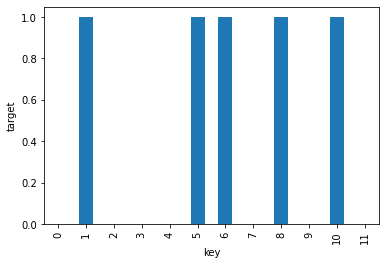

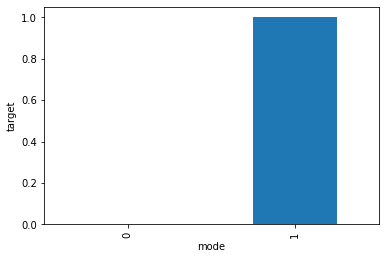

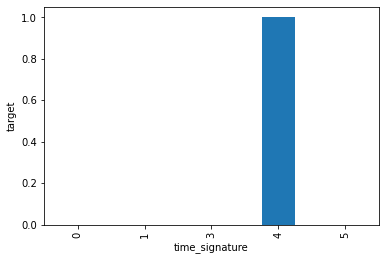

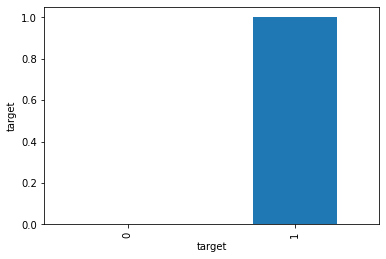

In [ ]:
#understanding impact of discrete values on target
for feature in discrete_feature: 
    data = df.copy()
    data.groupby(feature)["target"].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel("target")
    plt.show()

In [ ]:
#extracting continuous features
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
continuous_feature

['danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'chorus_hit',
 'sections']

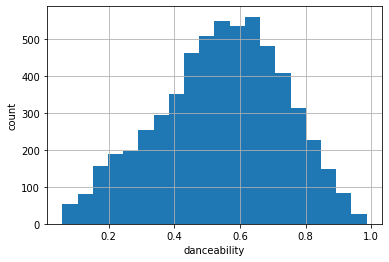

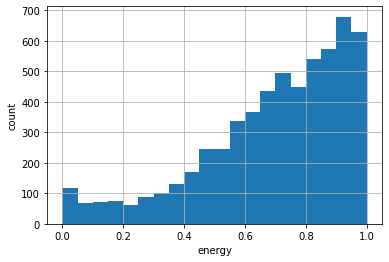

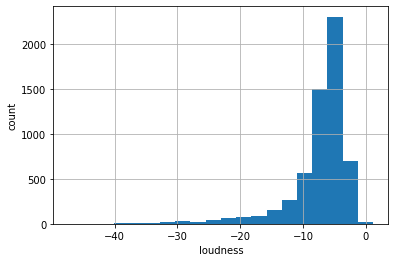

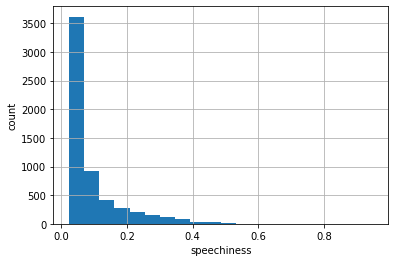

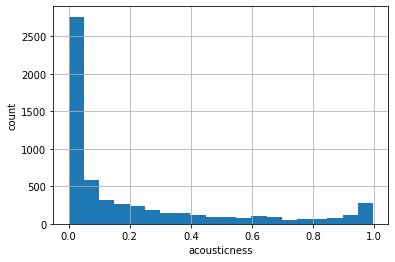

...

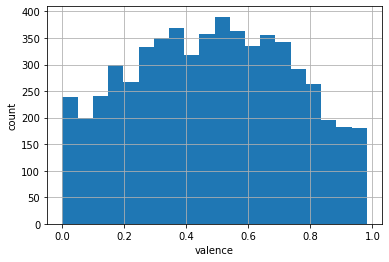

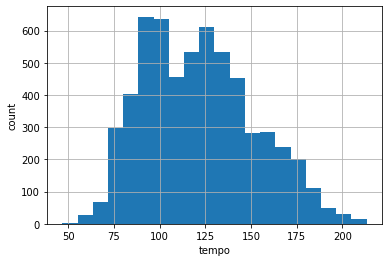

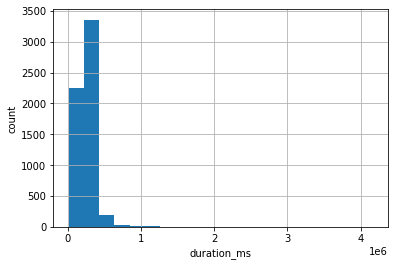

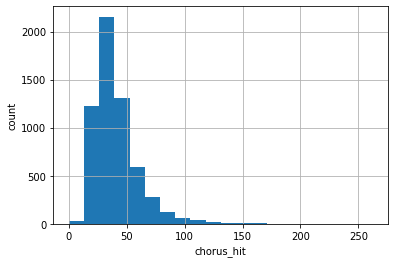

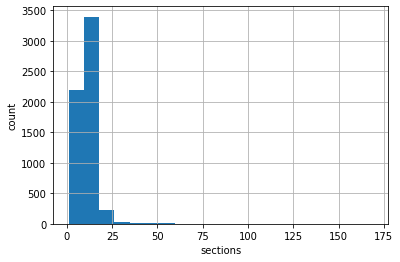

In [ ]:
#plotting continuous features
for feature in continuous_feature: 
    data = df.copy()
    data[feature].hist(bins=20)
    plt.xlabel(feature)
    plt.ylabel("count")
    plt.show()

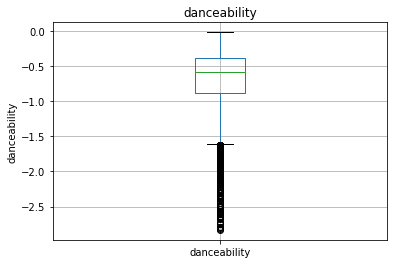

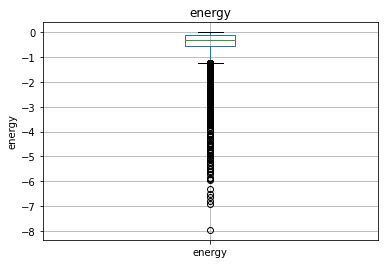

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


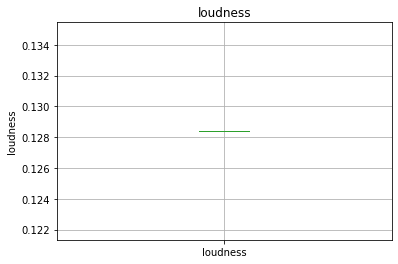

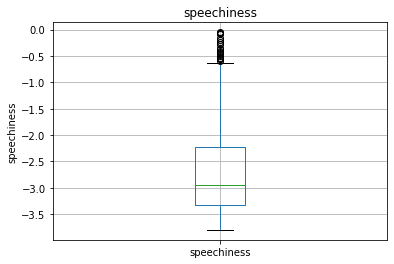

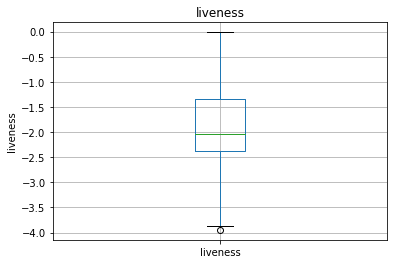

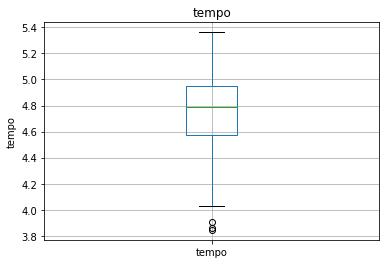

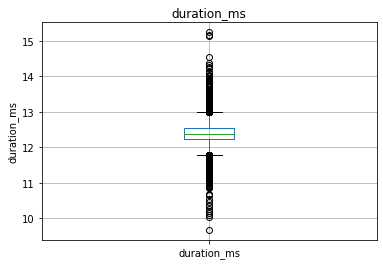

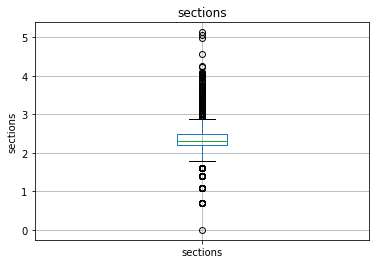

In [ ]:
#Here we are checking outliers
for feature in continuous_feature: 
    data = df.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature] = np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

In [ ]:
df.corr()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
danceability,1.000000,0.074201,0.019733,0.292798,-0.037738,0.164758,-0.184268,-0.335961,-0.113007,0.591426,-0.141072,-0.075976,0.183014,-0.083784,-0.053724,0.458550
energy,0.074201,1.000000,0.011642,0.775731,-0.008436,0.137077,-0.743515,-0.229903,0.206668,0.286406,0.221466,-0.144524,0.164477,-0.016899,-0.167458,0.084521
key,0.019733,0.011642,1.000000,0.001610,-0.148303,0.028565,-0.012443,0.002935,-0.020165,0.016495,0.004066,0.019962,-0.003832,-0.005687,0.007625,-0.004444
loudness,0.292798,0.775731,0.001610,1.000000,0.030354,0.096448,-0.684910,-0.441705,0.120931,0.336110,0.162579,-0.164971,0.192721,-0.062935,-0.170696,0.347300
mode,-0.037738,-0.008436,-0.148303,0.030354,1.000000,-0.062829,0.011798,-0.079606,0.011895,-0.011184,0.022168,-0.034388,0.024453,-0.039702,-0.016842,0.096097
speechiness,0.164758,0.137077,0.028565,0.096448,-0.062829,1.000000,-0.059198,-0.123527,0.141157,0.147927,-0.017618,0.017786,0.031691,-0.012479,0.023737,0.057114
acousticness,-0.184268,-0.743515,-0.012443,-0.684910,0.011798,-0.059198,1.000000,0.255473,-0.099947,-0.187287,-0.157567,0.135808,-0.180854,0.015188,0.156490,-0.223842
instrumentalness,-0.335961,-0.229903,0.002935,-0.441705,-0.079606,-0.123527,0.255473,1.000000,-0.049933,-0.334772,-0.031231,0.166849,-0.104313,0.092206,0.121436,-0.471290
liveness,-0.113007,0.206668,-0.020165,0.120931,0.011895,0.141157,-0.099947,-0.049933,1.000000,-0.013835,0.041468,-0.022631,0.021770,0.021775,-0.034278,-0.075539
valence,0.591426,0.286406,0.016495,0.336110,-0.011184,0.147927,-0.187287,-0.334772,-0.013835,1.000000,0.022010,-0.140885,0.155660,-0.078661,-0.096823,0.281006


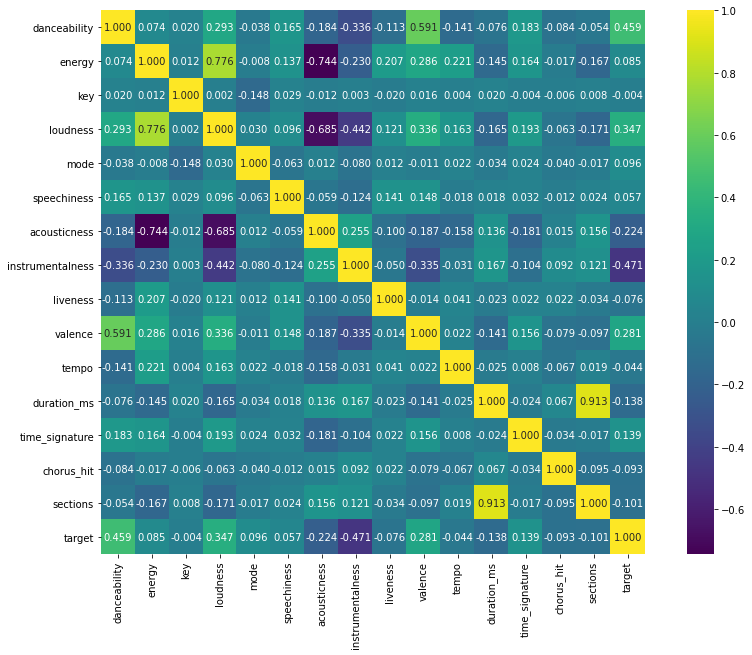

In [ ]:
#Here we show the correlation matrix to understand the range of impact of variables on Target. The lighter the shade the higher the imapact
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True, fmt='.3f', cmap='viridis',square=True)
plt.show()

In [ ]:
pip install category_encoders

     |████████████████████████████████| 81kB 3.6MB/s 


In [ ]:
from category_encoders.cat_boost import CatBoostEncoder

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
cbe = CatBoostEncoder()

In [ ]:
enc = cbe.fit_transform(df['artist'] , df['target'])

In [ ]:
data = df.copy()
data.drop(['track' , 'artist' , 'uri'] , axis = 1 , inplace = True)
data['artist'] = enc

In [ ]:
X = data.drop('target' , axis = 1)
y = data['target']

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Here we are scaling the values 
scaler = MinMaxScaler()
scaled_X = scaler.fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
#We are splitting the train test data set 
X_train , X_test , y_train , y_test = train_test_split(scaled_X , y , test_size = 0.185 , random_state = 42)

In [ ]:
from sklearn.svm import SVC

## **SUPPORT VECTOR MACHINE**
SVM is a supervised machine learning algorithm that is commonly used for classification and regression challenges. In the SVM algorithm, each point is represented as a data item within the n-dimensional space where the value of each feature is the value of a specific coordinate. After plotting, classification has been performed by finding hyper-plane, which differentiates two classes. Refer to the below image to understand this concept.

In [ ]:
#Defining the function
svc = SVC()

In [ ]:
#Here we are fitting the model and printing the score
svc.fit(X_train , y_train)
svc.score(X_test , y_test)

0.9199632014719411

In [ ]:
pred = svc.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
#Here we print the Confusion matrix
print(classification_report(y_test , pred))

              precision    recall  f1-score   support

           0       0.95      0.89      0.92       554
           1       0.89      0.95      0.92       533

    accuracy                           0.92      1087
   macro avg       0.92      0.92      0.92      1087
weighted avg       0.92      0.92      0.92      1087



# **RANDOM FOREST ALGORITHM**
The random forest algorithm is based on supervised learning. It can be used for both regression and classification problems. Random forests creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting. It also provides a pretty good indicator of the feature importance.

In [ ]:
from sklearn.datasets import make_classification

In [ ]:
from sklearn.ensemble import RandomForestClassifier
random_model = RandomForestClassifier()
random_model.fit(X_train,y_train)
ytrain_pred = random_model.predict_proba(X_train)
ytest_pred = random_model.predict_proba(X_test)
random_model.score(X_test , y_test)

0.9300827966881324

# **MULTILAYER PERCEPTRON**
Multi-Layer perceptron defines the most complicated architecture of artificial neural networks. A multilayer perceptron is a feed forward 
artificial neural network that generates a set of outputs from a set of inputs. An MLP is characterized by several layers of input nodes connected as a directed graph between the input nodes connected as a directed graph between the input and output layers.

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
mlp = MLPClassifier(max_iter=600 , learning_rate='adaptive')
mlp.fit(X_train , y_train)
mlp.score(X_test , y_test)

0.9199632014719411

In [ ]:
pred = mlp.predict(X_test)
print(classification_report(y_test , pred))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92       554
           1       0.88      0.96      0.92       533

    accuracy                           0.92      1087
   macro avg       0.92      0.92      0.92      1087
weighted avg       0.92      0.92      0.92      1087



In [ ]:
estimator = random_model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = numerical_feature,
                class_names = discrete_feature[3],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')